<a href="https://colab.research.google.com/github/redheadpanda/Style-Transfer/blob/main/Style_Transfer.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>



1.   Content image - object and their arrangement
2.  Style image - style, color and texture





Importing required libraries

In [1]:
%matplotlib inline

from PIL import Image
from io import BytesIO
import matplotlib.pyplot as plt
import numpy as np

import torch
import torch.optim as optim
import requests
from torchvision import transforms, models

I am going to use VGG19 to extract features from image

VGG19 is split in two parts:


1.   vgg19.features
2.   vgg19.classifier

Here only features are needed



In [2]:
vgg = models.vgg19(pretrained=True).features

#freezing all VGG parameters
for param in vgg.parameters():
    param.requires_grad_(False)

/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=VGG19_Weights.IMAGENET1K_V1`. You can also use `weights=VGG19_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/vgg19-dcbb9e9d.pth" to /root/.cache/torch/hub/checkpoints/vgg19-dcbb9e9d.pth
100%|██████████| 548M/548M [00:07<00:00, 75.8MB/s]


In [3]:
# to speed up computation
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

vgg.to(device)

Sequential(
  (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (1): ReLU(inplace=True)
  (2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (3): ReLU(inplace=True)
  (4): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (5): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (6): ReLU(inplace=True)
  (7): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (8): ReLU(inplace=True)
  (9): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (10): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (11): ReLU(inplace=True)
  (12): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (13): ReLU(inplace=True)
  (14): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (15): ReLU(inplace=True)
  (16): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (17): ReLU(inplace=True)
  (18): MaxPoo



1.   Resizing image for faster processing keeping the aspect ratio same
2.   Image is then converted into tensor
3.   Then image is unsqueezed along batch dimension because neural network expects data in batch



In [4]:
def load_image(img_path, max_size=400, shape=None):
    if "http" in img_path:
        response = requests.get(img_path)
        image = Image.open(BytesIO(response.content)).convert('RGB')
    else:
        image = Image.open(img_path).convert('RGB')


    if max(image.size) > max_size:
        size = max_size
    else:
        size = max(image.size)

    if shape is not None:
        size = shape

    in_transform = transforms.Compose([
                        transforms.Resize(size),
                        transforms.ToTensor(),
                        transforms.Normalize((0.485, 0.456, 0.406),
                                             (0.229, 0.224, 0.225))])

    # discard the transparent, alpha channel (:3)
    # add batch dimension
    image = in_transform(image)[:3,:,:].unsqueeze(0)

    return image

Load images

In [6]:
content = load_image('/content/space_needle.jpg').to(device)
style = load_image('/content/delaunay.jpg', shape=content.shape[-2:]).to(device)

Since the image has been converted into tensor, just for the purpose of displaying initial image, i am giving a function to convert it to NumPy image

In [7]:
def im_convert(tensor):
    image = tensor.to("cpu").clone().detach()
    image = image.numpy().squeeze()
    image = image.transpose(1,2,0)
    image = image * np.array((0.229, 0.224, 0.225)) + np.array((0.485, 0.456, 0.406))
    image = image.clip(0, 1)

    return image

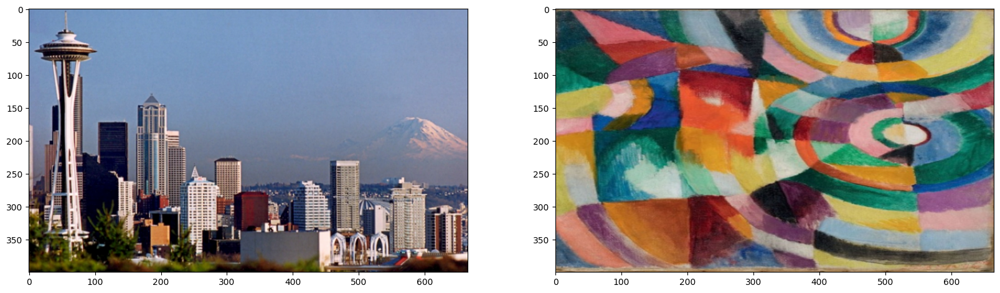

In [8]:
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 10))
ax1.imshow(im_convert(content))
ax2.imshow(im_convert(style))

Content and style features

get_features with three parameters:
1. Image we want to extract features for
2. the model we are using to extract features
3. Layers from which features are to be extracted

In [9]:
def get_features(image, model, layers=None):

    # Default set of layers
    if layers is None:
        layers = {'0': 'conv1_1',
                  '5': 'conv2_1',
                  '10': 'conv3_1',
                  '19': 'conv4_1',
                  '21': 'conv4_2',
                  '28': 'conv5_1'}

    features = {}
    x = image

    # model._modules is a dictionary holding each module in the model
    # iterate through layers
    for name, layer in model._modules.items():

        # this wil apply all the operations of that layer to image and will form a new tensor
        x = layer(x)
        if name in layers:
            features[layers[name]] = x

    return features

Gram Matrix contains inner product between vectors

in style transfer, feature maps wil be vectors



*   The Gram matrix
G summarizes the relationships between different feature maps. It reflects the style information encoded in those feature maps.
*   During training, the style loss is formulated using the mean squared difference between the Gram matrices of the generated and reference images. This loss guides the optimization process to produce images with similar style features.



In [10]:
def gram_matrix(tensor):

    # batch_size, depth, height, and width of the Tensor
    b, d, h, w = tensor.size()

    # reshape so we're multiplying the features for each channel
    tensor = tensor.view(b * d, h * w)

    # calculate the gram matrix
    gram = torch.mm(tensor, tensor.t())

    return gram

In [11]:
# get content and style features
content_features = get_features(content, vgg)
style_features = get_features(style, vgg)

# calculate the gram matrices for each layer
style_grams = {layer: gram_matrix(style_features[layer]) for layer in style_features}

# create a third "target" image and prep it for change
# then iteratively change its style
target = content.clone().requires_grad_(True).to(device)

In [12]:
style_weights = {'conv1_1': 1.,
                 'conv2_1': 0.75,
                 'conv3_1': 0.2,
                 'conv4_1': 0.2,
                 'conv5_1': 0.2}

content_weight = 1  # alpha
style_weight = 1e6  # beta

#### Content Loss

The content loss will be the mean squared difference between the target and content features at layer conv4_2. This can be calculated as follows:
```
content_loss = torch.mean((target_features['conv4_2'] - content_features['conv4_2'])**2)
```

#### Style Loss

The style loss is calculated in a similar way, only you have to iterate through a number of layers, specified by name in our dictionary style_weights.
 we'll calculate the gram matrix for the target image, target_gram and style image style_gram at each of these layers and compare those gram matrices, calculating the layer_style_loss.
 Later, we will see that this value is normalized by the size of the layer.

#### Total Loss

Total loss by adding up the style and content losses and weighting them with specified alpha and beta!

Total loss:  64754492.0


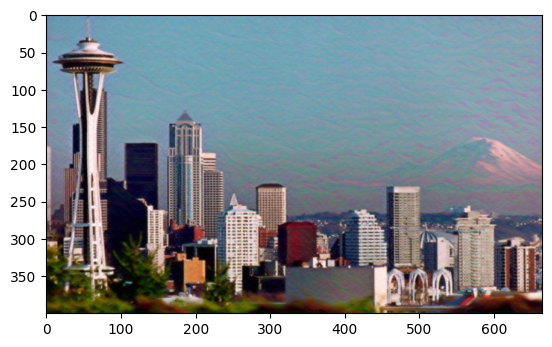

Total loss:  34686896.0


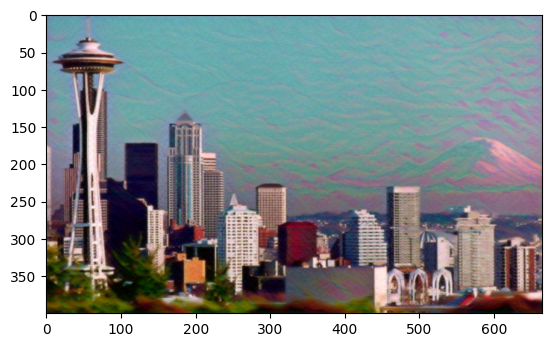

Total loss:  22726208.0


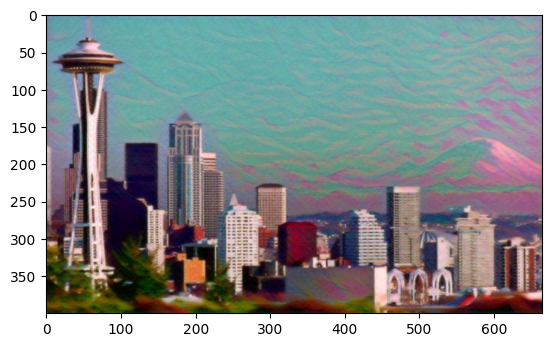

Total loss:  16502284.0


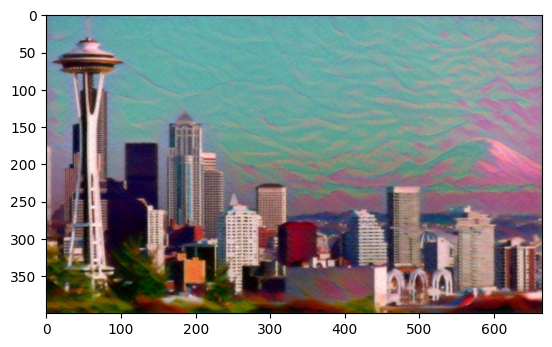

Total loss:  12622829.0


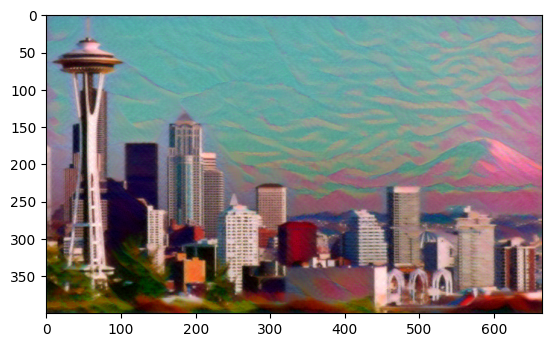

Total loss:  9887988.0


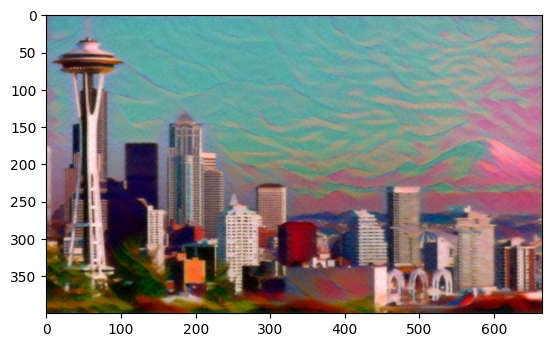

Total loss:  7813676.5


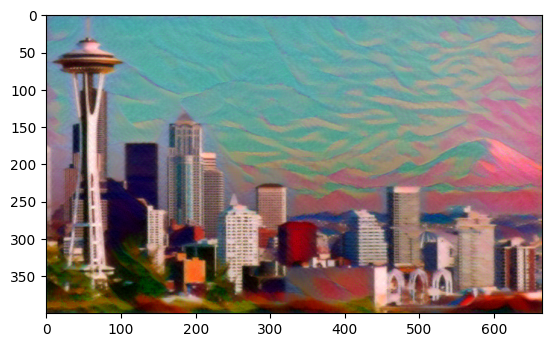

Total loss:  6204923.5


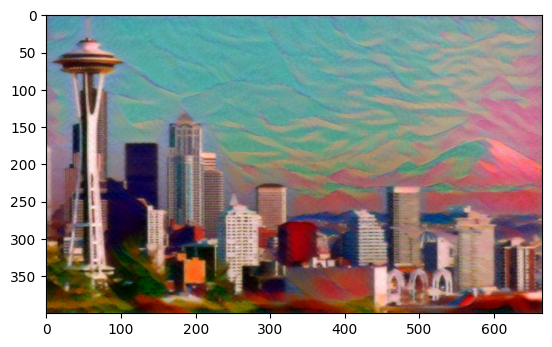

Total loss:  4972685.5


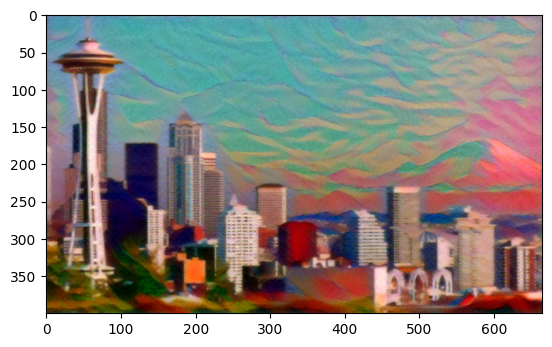

Total loss:  4032492.25


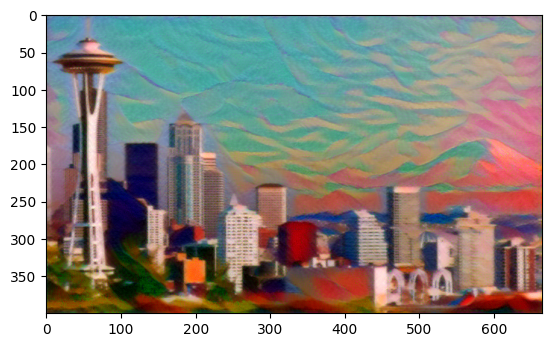

In [13]:
# for displaying the target image, intermittently
show_every = 100

# iteration hyperparameters
optimizer = optim.Adam([target], lr=0.003)
steps = 1000

for ii in range(1, steps+1):

    # get the features from target image
    target_features = get_features(target, vgg)

    content_loss = torch.mean((target_features['conv4_2'] - content_features['conv4_2'])**2)
    style_loss = 0

    for layer in style_weights:

        # get the "target" style representation for the layer
        target_feature = target_features[layer]
        target_gram = gram_matrix(target_feature)
        _, d, h, w = target_feature.shape

        # get the "style" style representation
        style_gram = style_grams[layer]

        # the style loss for one layer, weighted appropriately
        layer_style_loss = style_weights[layer] * torch.mean((target_gram - style_gram)**2)

        # add to the style loss
        style_loss += layer_style_loss / (d * h * w)

    # calculate the *total* loss
    total_loss = content_weight * content_loss + style_weight * style_loss

    # update your target image
    optimizer.zero_grad()
    total_loss.backward()
    optimizer.step()

    # display intermediate images and print the loss
    if  ii % show_every == 0:
        print('Total loss: ', total_loss.item())
        plt.imshow(im_convert(target))
        plt.show()

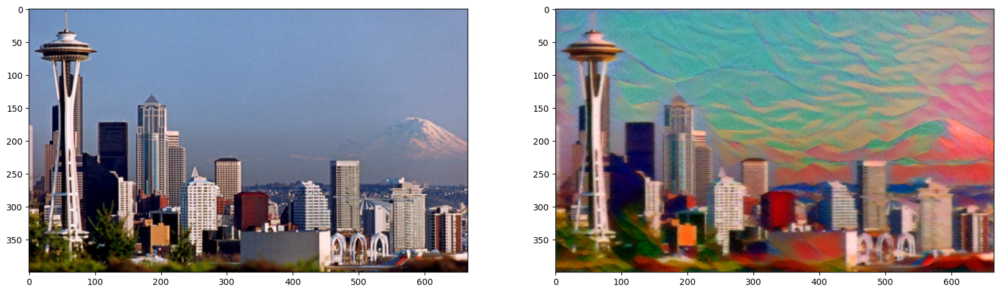

In [14]:
# display content and final, target image
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 10))
ax1.imshow(im_convert(content))
ax2.imshow(im_convert(target))

For 4000 steps

Total loss:  42658.61328125


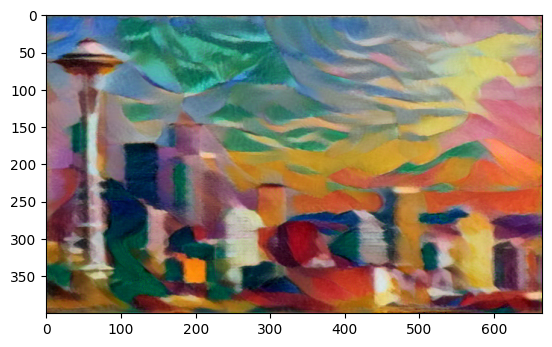

Total loss:  40826.8828125


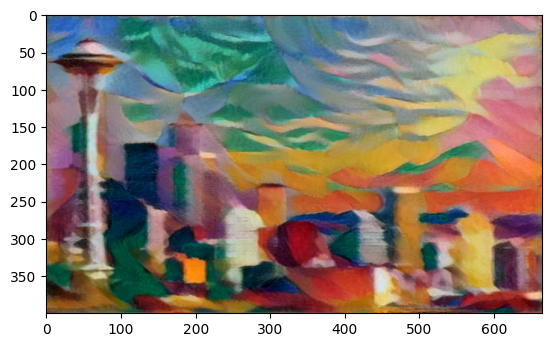

Total loss:  39021.8515625


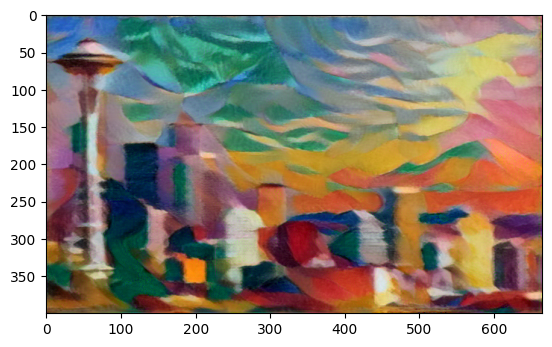

Total loss:  37919.80078125


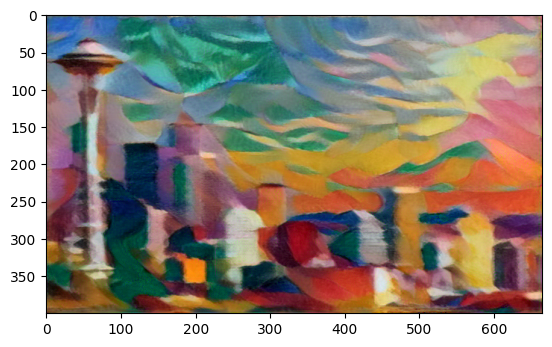

Total loss:  35689.53515625


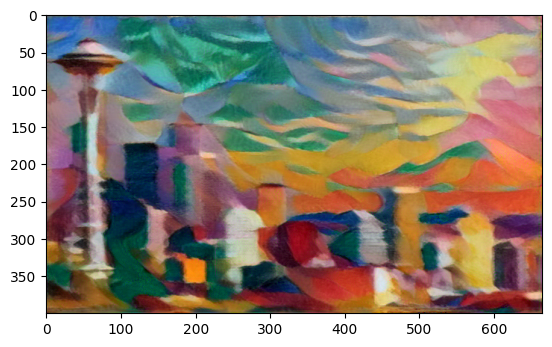

Total loss:  35072.2890625


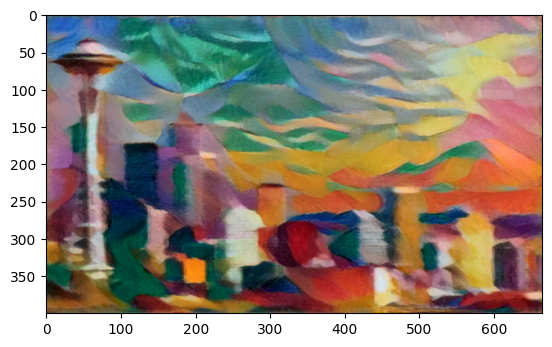

Total loss:  32832.34375


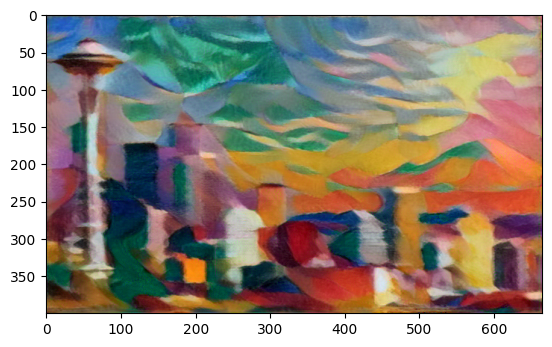

Total loss:  31654.1875


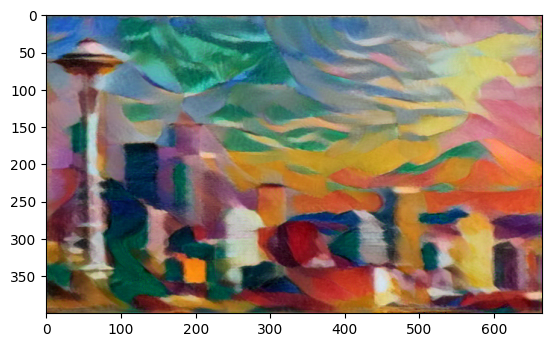

Total loss:  30910.923828125


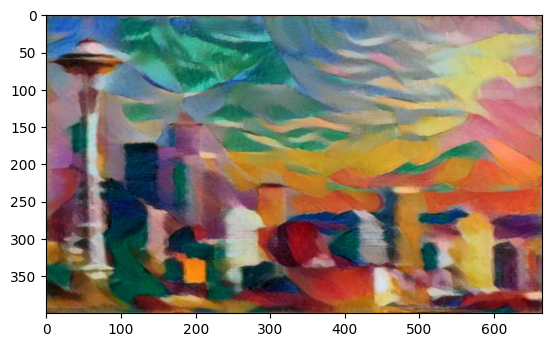

Total loss:  29471.0625


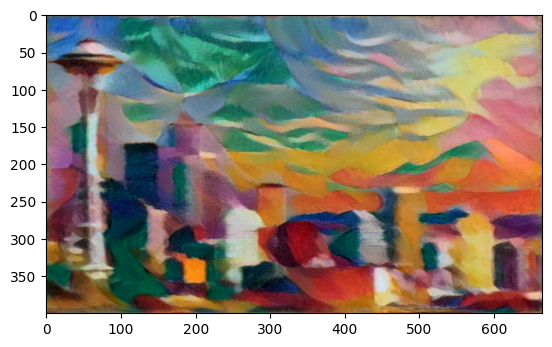

Total loss:  28972.94921875


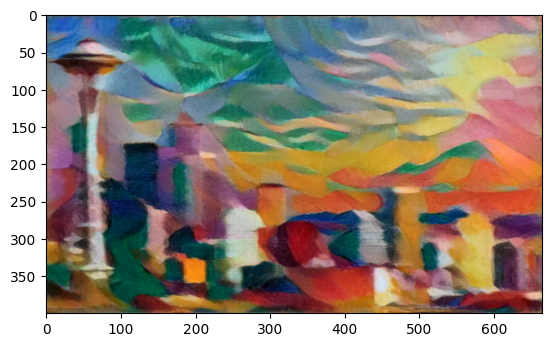

Total loss:  28099.640625


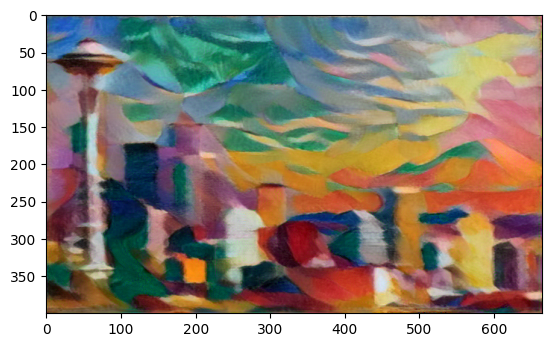

Total loss:  27187.609375


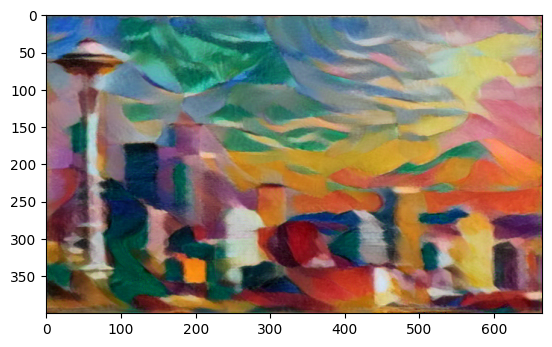

Total loss:  26534.47265625


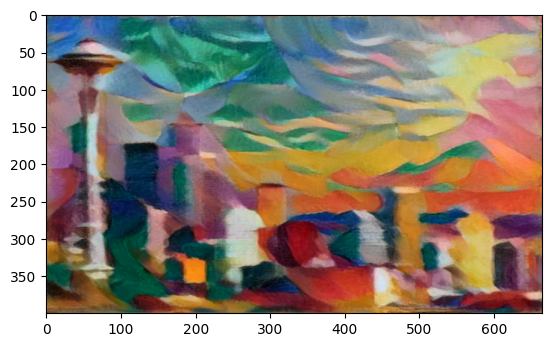

Total loss:  25904.990234375


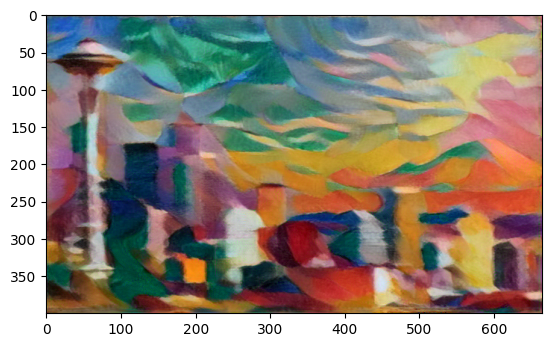

Total loss:  25712.1484375


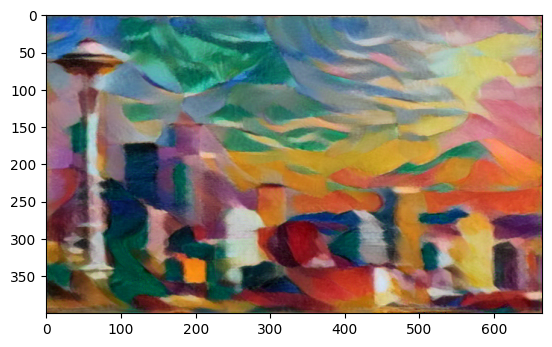

Total loss:  24914.62109375


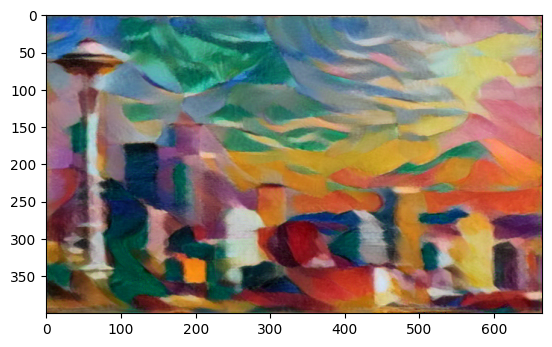

Total loss:  24240.669921875


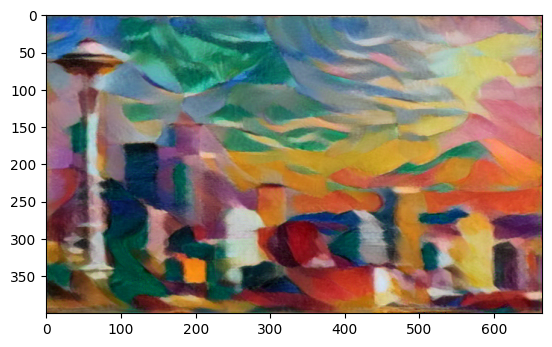

Total loss:  23965.880859375


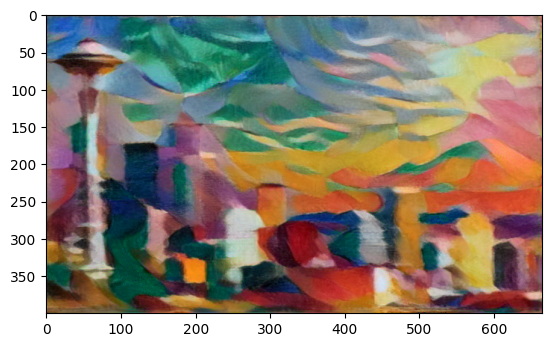

Total loss:  24393.373046875


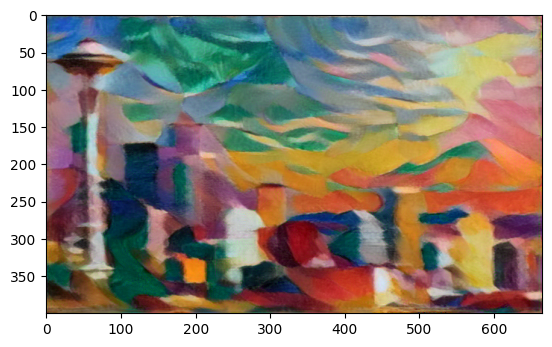

In [16]:
# for displaying the target image, intermittently
show_every = 200

# iteration hyperparameters
optimizer = optim.Adam([target], lr=0.003)
steps = 4000

for ii in range(1, steps+1):

    # get the features from target image
    target_features = get_features(target, vgg)

    content_loss = torch.mean((target_features['conv4_2'] - content_features['conv4_2'])**2)
    style_loss = 0

    for layer in style_weights:

        # get the "target" style representation for the layer
        target_feature = target_features[layer]
        target_gram = gram_matrix(target_feature)
        _, d, h, w = target_feature.shape

        # get the "style" style representation
        style_gram = style_grams[layer]

        # the style loss for one layer, weighted appropriately
        layer_style_loss = style_weights[layer] * torch.mean((target_gram - style_gram)**2)

        # add to the style loss
        style_loss += layer_style_loss / (d * h * w)

    # calculate the *total* loss
    total_loss = content_weight * content_loss + style_weight * style_loss

    # update your target image
    optimizer.zero_grad()
    total_loss.backward()
    optimizer.step()

    # display intermediate images and print the loss
    if  ii % show_every == 0:
        print('Total loss: ', total_loss.item())
        plt.imshow(im_convert(target))
        plt.show()

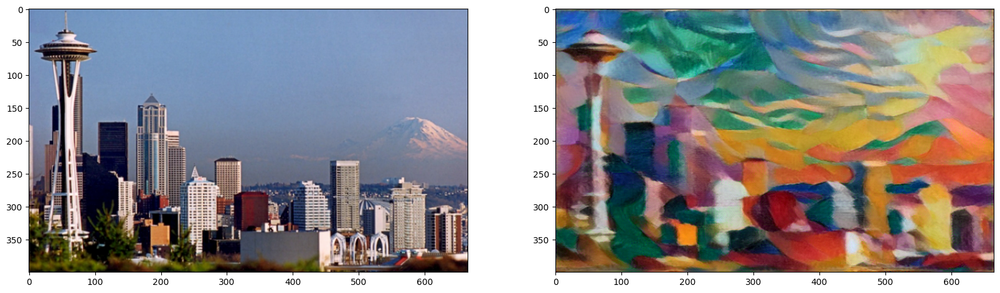

In [17]:
# display content and final, target image
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 10))
ax1.imshow(im_convert(content))
ax2.imshow(im_convert(target))